In [1]:
import importlib
import os
from pathlib import Path
from pprint import pprint as pp

import geoviews as gv
import holoviews as hv
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pyadcirc.adcirc_utils as au
import pyadcirc.figuregen as fg
import xarray as xr
from cartopy import crs
from holoviews import opts
from IPython.display import Image
from pyadcirc import noaa
from taccjm import taccjm as tjm

%matplotlib widget

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
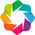

In [2]:
# Viewing options configurations
gv.extension("bokeh")
gv.opts.defaults(
    gv.opts.EdgePaths(width=700, height=700),
    gv.opts.Image(width=700, height=700),
    gv.opts.Points(width=700, height=700),
    gv.opts.RGB(width=450, height=450),
)

In [3]:
# Dir with this notebook resides
base_dir = Path(os.path.dirname(os.getcwd()))
data_dir = base_dir / "notebooks" / "data"
data_dir.mkdir(exist_ok=True)
base_dir, data_dir

(PosixPath('/Users/carlos/repos/pyadcirc'),
 PosixPath('/Users/carlos/repos/pyadcirc/notebooks/data'))

In [153]:
# Pub dir paths on TACC. Should be accessible from all systems
pub_dir = Path("/work2/06307/clos21/pub")
adc_inputs = pub_dir / "adcirc" / "inputs"
adc_execs = pub_dir / "adcirc" / "execs"

# Path to input files for this notebooks ADCIRC run
input_path = adc_inputs / "Alaska" / "met" / "Feb2019" / "CSFv2"

scan_base_input_path = adc_inputs / "Alaska" / "scans" / "Feb2019" / "CSFv2" / "base"

In [7]:
ak_data_dir = data_dir / "AK_Feb2019"
ak_data_dir.mkdir(exist_ok=True)

In [8]:
jm = "l1"
system = "ls6"

# Alaska LW Grid - Feb 2019 Run

Running and analyzing input/output for Feb2019 CSFv2 Wind+Ice forcing data run. Uses LW Alaska Mesh from Notre Dame group.

Notebooks sections

* Setup:
    * TACC Job Manager
    * ADCIRC Data
    * ADCIRC Executables
* Running
* Analyzing

# Set-Up

Here we go over the basic set-up of how this will be run.

## TACC Job Manager - Initialize


* Lets name our job manager instance `l1`. The name of the JM instance will dictate where all app, job, and other data generated by taccjm will be stored. 

* Choose system to run ADCIRC on - Here we choose ls6 - [Lonestar 6](https://portal.tacc.utexas.edu/user-guides/lonestar5)


In [10]:
jms = tjm.list_jms()
jms

[]

In [11]:
if jm not in [j["jm_id"] for j in jms]:
    tjm.init_jm(jm, system)
else:
    print(f"{jm} already initialized:")
    pp(tjm.get_jm(jm))

Username:  clos21
psw:  ·········
mfa:  318011


## Data - Feb 2019 Wind+Ice CFSv2 Data w/LW AK Mesh

We will be using the data in from met folder in Alaska corresponding to Feb2019 CSFv2 Data:

In [16]:
tjm.list_files(jm, input_path)

['fort.13',
 'fort.225',
 'fort.24',
 'fort.15',
 'fort.222',
 'fort.14',
 'fort.221',
 'fort.25',
 'fort.22']

Lets get the fort.14/fort.15 files and read configurations of run

In [17]:
f14_path = ak_data_dir / "fort.14"
f15_path = ak_data_dir / "fort.15"

In [18]:
f15_path

PosixPath('/Users/carlos/repos/pyadcirc/notebooks/data/AK_Feb2019/fort.15')

In [19]:
tjm.download(jm, input_path / "fort.15", f15_path)
tjm.download(jm, input_path / "fort.14", f14_path)

In [20]:
configs = au.read_fort14(str(f14_path), load_grid=False)
configs = au.read_fort15(str(f15_path), ds=configs)
configs

<xarray.Dataset>
Dimensions:                (ELEV_BOUNDARY: 574, NORMAL_BOUNDARY: 37546,
                            NODAL_ATTRS: 3, TIPOTAG: 8, BOUNTAG: 8,
                            ALPHA: 4592, STATIONS: 27, STATIONS_VEL: 27,
                            STATIONS_MET: 27, NAMEFR: 8)
Coordinates:
  * ELEV_BOUNDARY          (ELEV_BOUNDARY) int64 0 0 0 0 0 0 0 ... 1 1 1 1 1 1 1
  * NORMAL_BOUNDARY        (NORMAL_BOUNDARY) int64 0 0 0 0 0 ... 479 479 479 479
  * NODAL_ATTRS            (NODAL_ATTRS) <U42 'primitive_weighting_in_continu...
  * TIPOTAG                (TIPOTAG) object 'Q1' 'O1' 'P1' ... 'M2' 'S2' 'K2'
  * BOUNTAG                (BOUNTAG) object 'Q1' 'O1' 'P1' ... 'M2' 'S2' 'K2'
  * ALPHA                  (ALPHA) object 'Q1' 'Q1' 'Q1' 'Q1' ... 'K2' 'K2' 'K2'
  * STATIONS               (STATIONS) int64 0 1 2 3 4 5 6 ... 21 22 23 24 25 26
  * STATIONS_VEL           (STATIONS_VEL) int64 0 1 2 3 4 5 ... 22 23 24 25 26
  * STATIONS_MET           (STATIONS_MET) int64 0 1 2 3 4 5 ... 22 23 24 25 26
  * NAMEFR                 (NAMEFR) object 'Q1' 'O1' 'P1' ... 'M2' 'S2' 'K2'
Data variables: (12/23)
    IBTYPEE                (ELEV_BOUNDARY) int64 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0
    ELEV_BOUNDARY_NODES    (ELEV_BOUNDARY) int64 380573 380571 ... 3621 3351
    IBTYPE                 (NORMAL_BOUNDARY) int64 20 20 20 20 ... 21 21 21 21
    NORMAL_BOUNDARY_NODES  (NORMAL_BOUNDARY) int64 139030 139031 ... 335404
    TPK                    (TIPOTAG) float64 0.0193 0.1008 ... 0.1133 0.03078
    AMIGT                  (TIPOTAG) float64 6.496e-05 6.76e-05 ... 0.0001458
    ...                     ...
    YEV                    (STATIONS_VEL) float64 55.33 56.25 ... 67.58 70.41
    XEM                    (STATIONS_MET) float64 228.4 225.4 ... 195.9 211.5
    YEM                    (STATIONS_MET) float64 55.33 56.25 ... 67.58 70.41
    HAFREQ                 (NAMEFR) float64 6.496e-05 6.76e-05 ... 0.0001458
    HAFF                   (NAMEFR) float64 0.9559 0.9749 ... 0.9994 0.9455
    HAFACE                 (NAMEFR) float64 225.9 171.9 60.47 ... 359.9 77.98
Attributes: (12/100)
    AGRID:         Mindo's Alaska mesh
    NE:            850855
    NP:            443770
    NOPE:          2
    NETA:          574
    NBOU:          480
    ...            ...
    NCCOM:         Comments: Used for thesis research
    NCHOST:        Host: Name
    NCCONV:        Metric, MSL
    NCCONT:        carlos.delcastillo@utexas.edu
    NCDATE:        2019-02-01 00:00:00 UTC
    CONTROL_LIST:  ['! -- Begin met Control Namelist --', '&metControl', 'Win...

Met forcing files can be quite large. Lets not download them, just take a peak at the first line.

We know since NWS value in fort.15 config is :

In [21]:
configs.attrs["NWS"]

12012

This means data is in OWI format (see https://wiki.adcirc.org/wiki/NWS for more on NWS param).

So first line should contain date range we are working with

In [22]:
# OceanWeather Data format
date_range = [
    x
    for x in tjm.peak_file(jm, input_path / "fort.221", head=1)[:-1].split(" ")
    if x != ""
][-2:]
date_range

['2019020100', '2019030100']

### Modifying fort.15 control file

First we download locally 

Modifications to make:

* Make NCDATE line up with start of meteorological data date
* Set recording stations to NOAA Alaska Area recording stations.
* Set desired frequency of recording at stations


In [38]:
configs.attrs["NCDATE"] = "2019-02-01 00:00:00 UTC"
configs.attrs["NCDATE"]

'2019-02-01 00:00:00 UTC'

### Adding NOAA Stations

Get NOAA Tide Stations to use for recording stations in ADCIRC run using utility function `get_f15_stations`

Copy and paste the output of the function to appropriate sections after NSTAE,NSTAV,NSTAM lines.

In [90]:
importlib.reload(noaa)

<module 'pyadcirc.noaa' from '/Users/carlos/repos/pyadcirc/src/pyadcirc/noaa.py'>

In [96]:
f15_stations_txt = noaa.get_f15_stations("Alaska")
print(f15_stations_txt)

Getting NOAA station 9450460.0 - Ketchikan, AK
Getting NOAA station 9451054.0 - Port Alexander, AK
Getting NOAA station 9451600.0 - Sitka, AK
Getting NOAA station 9452210.0 - Juneau, AK
Getting NOAA station 9452400.0 - Skagway, Taiya Inlet, AK
Getting NOAA station 9452634.0 - Elfin Cove, AK
Getting NOAA station 9453220.0 - Yakutat, Yakutat Bay, AK
Getting NOAA station 9454050.0 - Cordova, AK
Getting NOAA station 9454240.0 - Valdez, AK
Getting NOAA station 9455090.0 - Seward, AK
Getting NOAA station 9455500.0 - Seldovia, AK
Getting NOAA station 9455760.0 - Nikiski, AK
Getting NOAA station 9455920.0 - Anchorage, AK
Getting NOAA station 9457292.0 - Kodiak Island, AK
Getting NOAA station 9457804.0 - Alitak, AK
Getting NOAA station 9459450.0 - Sand Point, AK
Getting NOAA station 9459881.0 - King Cove, AK
Getting NOAA station 9461380.0 - Adak Island, AK
Getting NOAA station 9461710.0 - Atka, AK
Getting NOAA station 9462450.0 - Nikolski, AK
Getting NOAA station 9462620.0 - Unalaska, AK
Gettin

### Re-uploading fort.15 file

In [33]:
# tjm.upload(jm, f15_path, input_path / "fort.15")

## Executables - ADCIRC Version

Choose for appropriate TACC System:

In [23]:
tjm.list_files(jm, adc_execs)

['ls6', 'stampede2']

Choose appropriate version:

In [24]:
tjm.list_files(jm, adc_execs / "ls6")

['v55_nodal_beta', 'v55.01']

Verify executables exist:

In [25]:
# Lonestar6 v55.01 execs
ls6_v55_path = adc_execs / "ls6" / "v55.01"
tjm.list_files(jm, ls6_v55_path)

['padcirc', 'adcprep']

In [26]:
# Lonestar6 v55.01 execs
ls6_v55_beta = adc_execs / "ls6" / "v55_nodal_beta"
tjm.list_files(jm, ls6_v55_beta)

['padcirc', 'adcprep']

# Running ADCIRC 

Here we go over the details of running ADCIRC 

### ADCIRC App Config

Basic ADCIRC App config:

In [28]:
tjm.list_apps(jm)

['ls6_adcirc--0.0.0']

In [29]:
tjm.get_app(jm, "ls6_adcirc--0.0.0")

{'name': 'ls6_adcirc--0.0.0',
 'short_desc': 'General purpose adcirc application for ls6.',
 'long_desc': '',
 'default_node_count': 1,
 'default_processors_per_node': 10,
 'default_memory_per_node': '1',
 'default_max_run_time': '00:10:00',
 'default_queue': 'development',
 'entry_script': 'run.sh',
 'inputs': [],
 'parameters': [{'name': 'inputDirectory',
   'label': 'Input Directory',
   'desc': 'The directory containing ADCIRC input files.'},
  {'name': 'execDirectory',
   'label': 'Executables Directory',
   'desc': 'The directory containing ADCIRC executables to use.'},
  {'name': 'writeProcesses',
   'label': 'Number of Write Processes',
   'desc': 'Number of processes to dedicate to writing output data.'}],
 'outputs': [{'name': 'Outputs',
   'label': 'Output Directory',
   'desc': 'Directory containing output to archive.'}]}

### Configure job 

Configure inputs

In [27]:
# Set execs_dir for future cells to use
in_dir = input_path
execs_dir = ls6_v55_beta
write_proc = 4

In [33]:
job_config = {
    "name": "beta-ak_lw_feb2019_wind+ice",
    "app": "ls6_adcirc--0.0.0",
    "desc": "ADCIRC LW Mesh on LS6 with Feb2019 wind and ice data using v55 branch implementing nodal beta parameter for ice parametrization.",
    "queue": "normal",
    "node_count": 5,
    "processors_per_node": 30,
    "memory_per_node": 0,
    "max_run_time": "00:30:00",
}
job_config["inputs"] = {}
job_config["parameters"] = {
    "inputDirectory": f"{in_dir}",
    "execDirectory": f"{execs_dir}",
    "writeProcesses": write_proc,
}
pp(job_config)

{'app': 'ls6_adcirc--0.0.0',
 'desc': 'ADCIRC LW Mesh on LS6 with Feb2019 wind and ice data using v55 '
         'branch implementing nodal beta parameter for ice parametrization.',
 'inputs': {},
 'max_run_time': '00:30:00',
 'memory_per_node': 0,
 'name': 'beta-ak_lw_feb2019_wind+ice',
 'node_count': 5,
 'parameters': {'execDirectory': '/work2/06307/clos21/pub/adcirc/execs/ls6/v55_nodal_beta',
                'inputDirectory': '/work2/06307/clos21/pub/adcirc/inputs/Alaska/met/Feb2019/CSFv2',
                'writeProcesses': 1},
 'processors_per_node': 30,
 'queue': 'normal'}


### Deploy Job 


In [34]:
importlib.reload(tjm)

<module 'taccjm.taccjm' from '/Users/carlos/repos/taccjm/src/taccjm/taccjm.py'>

In [35]:
deployed = tjm.deploy_job(jm, job_config=job_config)
pp(deployed)

{'app': 'ls6_adcirc--0.0.0',
 'desc': 'ADCIRC LW Mesh on LS6 with Feb2019 wind and ice data using v55 '
         'branch implementing nodal beta parameter for ice parametrization.',
 'entry_script': 'run.sh',
 'inputs': {},
 'job_dir': '/scratch/06307/clos21/l1/jobs/beta-ak_lw_feb2019_wind+ice_20220209_090339',
 'job_id': 'beta-ak_lw_feb2019_wind+ice_20220209_090339',
 'max_run_time': '00:30:00',
 'memory_per_node': 0,
 'name': 'beta-ak_lw_feb2019_wind+ice',
 'node_count': 5,
 'parameters': {'execDirectory': '/work2/06307/clos21/pub/adcirc/execs/ls6/v55_nodal_beta',
                'inputDirectory': '/work2/06307/clos21/pub/adcirc/inputs/Alaska/met/Feb2019/CSFv2',
                'writeProcesses': 1},
 'processors_per_node': 30,
 'queue': 'normal'}


In [36]:
# Note list_job_files not working at the  moment
tjm.list_files(jm, deployed["job_dir"])

['test', 'job.json', 'run.sh', 'app.json', 'submit_script.sh']

### Running Job

Now we can submit the job to run on the execution queue

In [37]:
submitted = tjm.submit_job(jm, deployed["job_id"])

In [38]:
pp(submitted)

{'app': 'ls6_adcirc--0.0.0',
 'desc': 'ADCIRC LW Mesh on LS6 with Feb2019 wind and ice data using v55 '
         'branch implementing nodal beta parameter for ice parametrization.',
 'entry_script': 'run.sh',
 'inputs': {},
 'job_dir': '/scratch/06307/clos21/l1/jobs/beta-ak_lw_feb2019_wind+ice_20220209_090339',
 'job_id': 'beta-ak_lw_feb2019_wind+ice_20220209_090339',
 'max_run_time': '00:30:00',
 'memory_per_node': 0,
 'name': 'beta-ak_lw_feb2019_wind+ice',
 'node_count': 5,
 'parameters': {'execDirectory': '/work2/06307/clos21/pub/adcirc/execs/ls6/v55_nodal_beta',
                'inputDirectory': '/work2/06307/clos21/pub/adcirc/inputs/Alaska/met/Feb2019/CSFv2',
                'writeProcesses': 1},
 'processors_per_node': 30,
 'queue': 'normal',
 'slurm_id': '57615'}


### Checking job status

In [48]:
tjm.get_queue(jm)

[{'job_id': '57615',
  'job_name': 'beta-ak_lw',
  'username': 'clos21',
  'state': 'Complte',
  'nodes': '5',
  'remaining': '5',
  'start_time': 'Unknown'}]

In [40]:
job_dir = submitted["job_dir"]
job_dir

'/scratch/06307/clos21/l1/jobs/beta-ak_lw_feb2019_wind+ice_20220209_090339'

We can also look at job files 

For example for adcirc runs we can look for an adcirc.log file (provided the appropriate setting is set in fort.15 file to output to log file)

In [44]:
job_files = tjm.list_files(jm, submitted["job_dir"])
job_files.sort()
[j for j in job_files if not j.startswith("PE")]

['adcprep',
 'app.json',
 'beta-ak_lw_feb2019_wind+ice_20220209_090339.e57615',
 'beta-ak_lw_feb2019_wind+ice_20220209_090339.o57615',
 'fort.13',
 'fort.14',
 'fort.15',
 'fort.16',
 'fort.22',
 'fort.221',
 'fort.222',
 'fort.225',
 'fort.24',
 'fort.25',
 'fort.61.nc',
 'fort.62.nc',
 'fort.63.nc',
 'fort.64.nc',
 'fort.71.nc',
 'fort.72.nc',
 'fort.73.nc',
 'fort.74.nc',
 'fort.80',
 'job.json',
 'maxele.63.nc',
 'maxrs.63.nc',
 'maxvel.63.nc',
 'maxwvel.63.nc',
 'metis_graph.txt',
 'minpr.63.nc',
 'output.eo.txt',
 'padcirc',
 'partmesh.txt',
 'run.sh',
 'submit_script.sh',
 'test']

And we can peak at the end of the file to see how long the run is going

In [47]:
print(tjm.peak_file(jm, str(Path(submitted["job_dir"]) / "output.eo.txt"), tail=20))

ERROR: writeOutArrayNetCDF: No netCDF for files with unit number 91.
ERROR: writeOutArrayNetCDF: No netCDF for files with unit number 91.
ERROR: writeOutArrayNetCDF: No netCDF for files with unit number 91.
ERROR: writeOutArrayNetCDF: No netCDF for files with unit number 91.
ERROR: writeOutArrayNetCDF: No netCDF for files with unit number 91.
ERROR: writeOutArrayNetCDF: No netCDF for files with unit number 91.
ERROR: writeOutArrayNetCDF: No netCDF for files with unit number 91.
INFO: owi_readNextSnap: Processing Oceanweather wind data for time stamp    190226000  0
ERROR: writeOutArrayNetCDF: No netCDF for files with unit number 91.
ERROR: writeOutArrayNetCDF: No netCDF for files with unit number 91.
ERROR: writeOutArrayNetCDF: No netCDF for files with unit number 91.
ERROR: writeOutArrayNetCDF: No netCDF for files with unit number 91.
ERROR: writeOutArrayNetCDF: No netCDF for files with unit number 91.
ERROR: writeOutArrayNetCDF: No netCDF for files with unit number 91.
ERROR: writeOu

In [194]:
print(
    tjm.peak_file(
        jm,
        str(
            Path(submitted["job_dir"])
            / f"{submitted['job_id']}.e{submitted['slurm_id']}"
        ),
        tail=2,
    )
)

+ ibrun -np 4 ./padcirc -W 0
slurmstepd: error: *** JOB 50473 ON c302-005 CANCELLED AT 2022-02-03T18:03:25 DUE TO TIME LIMIT ***



# Analyze Output

In [49]:
# Old
# v55_wind_ice_run_dir = Path(
#     "/scratch/06307/clos21/l1/jobs/ak_lw_feb2019_wind+ice_20220207_220322"
# )
# v55_wind_ice_run_dir = Path(
#     "/scratch/06307/clos21/l1/jobs/ak_lw_feb2019_wind+ice_20220208_153527"
# )
v55 = Path("/scratch/06307/clos21/l1/jobs/ak_lw_feb2019_wind+ice_20220208_163943")
v55_beta = Path(
    "/scratch/06307/clos21/l1/jobs/beta-ak_lw_feb2019_wind+ice_20220209_090339"
)

In [50]:
def list_adc_run_files(run_dir):
    """
    Quick utility to list none PE* files in run dir.
    """
    job_files = tjm.list_files(jm, run_dir)
    job_files.sort()
    job_files = [j for j in job_files if not j.startswith("PE")]
    return job_files

In [51]:
def get_file(run_dir, f, name=None):
    """
    Quick utility to download job file to local notebook folder
    """
    name = f if name is None else name
    remote_path = run_dir / f
    local_path = ak_data_dir / name
    tjm.download(jm, remote_path, local_path)
    return local_path

## F61 - Station Elevation Time Series

### v55

In [52]:
f61_path = get_file(v55, "fort.61.nc", "fort.61.nc")
f61_path

PosixPath('/Users/carlos/repos/pyadcirc/notebooks/data/AK_Feb2019/fort.61.nc')

In [53]:
f61 = xr.open_dataset(f61_path)
f61

<xarray.Dataset>
Dimensions:       (time: 3600, station: 27)
Coordinates:
  * time          (time) datetime64[ns] 2019-02-11T00:06:00 ... 2019-02-26
Dimensions without coordinates: station
Data variables:
    station_name  (station) |S50 ...
    x             (station) float64 ...
    y             (station) float64 ...
    zeta          (time, station) float64 ...
Attributes: (12/50)
    _FillValue:         -99999.0
    dry_Value:          -99999.0
    model:              ADCIRC
    version:            v55.01-10-g08f4100
    grid_type:          Triangular
    description:        OceanMesh2D
    ...                 ...
    sfea0:              58.643293
    cf:                 0.0015
    eslm:               -0.2
    cori:               0.0
    ntif:               8
    nbfr:               8

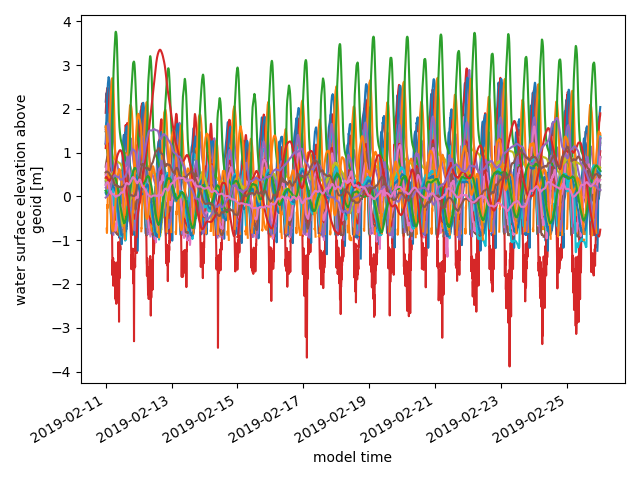

In [54]:
# This plot should show variability across every station
# Also no unreasonably high values (>4m across all stations)
fig, ax = plt.subplots(1, 1)
for s in range(len(f61["station_name"])):
    f61.isel(station=s)["zeta"].plot(ax=ax)
fig.tight_layout()

### v55 - beta

In [55]:
f61_beta_path = get_file(v55_beta, "fort.61.nc", "beta-fort.61.nc")
f61_beta_path

PosixPath('/Users/carlos/repos/pyadcirc/notebooks/data/AK_Feb2019/beta-fort.61.nc')

In [56]:
f61_beta = xr.open_dataset(f61_beta_path)
f61_beta

<xarray.Dataset>
Dimensions:       (time: 3600, station: 27)
Coordinates:
  * time          (time) datetime64[ns] 2019-02-11T00:06:00 ... 2019-02-26
Dimensions without coordinates: station
Data variables:
    station_name  (station) |S50 ...
    x             (station) float64 ...
    y             (station) float64 ...
    zeta          (time, station) float64 ...
Attributes: (12/50)
    _FillValue:         -99999.0
    dry_Value:          -99999.0
    model:              ADCIRC
    version:            v55.01-10-g08f4100
    grid_type:          Triangular
    description:        OceanMesh2D
    ...                 ...
    sfea0:              58.643293
    cf:                 0.0015
    eslm:               -0.2
    cori:               0.0
    ntif:               8
    nbfr:               8

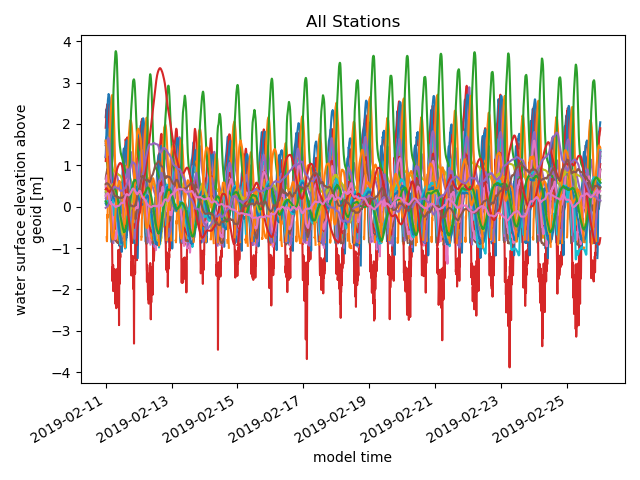

In [75]:
# This plot should show variability across every station
# Also no unreasonably high values (>4m across all stations)
fig, ax = plt.subplots(1, 1)
for s in range(len(f61_beta["station_name"])):
    f61_beta.isel(station=s)["zeta"].plot(ax=ax)
ax.set_title('All Stations')
fig.tight_layout()

### NOAA Station Comparison


In [59]:
station_idx = 24

In [60]:
station_id = (
    f61["station_name"].values[station_idx].decode("utf-8").strip().split(" ")[2]
)
station_id = int(float(station_id))
station_id

9468756

In [67]:
noaa_station = noaa.get_station_metadata(station_id)
noaa_station

{'name': 'Nome, Norton Sound',
 'id': 9468756,
 'coords': [194.560361, 64.494611]}

In [61]:
start_date = f61["time"].to_pandas()[0].strftime("%Y%m%d %H:%M")
end_date = f61["time"].to_pandas()[-1].strftime("%Y%m%d %H:%M")
start_date, end_date

('20190211 00:06', '20190226 00:00')

In [65]:
noaa_data = noaa.get_station_data(station_id, start_date, end_date)
noaa_data

<xarray.DataArray 'water_levels' (time: 3600)>
array([0.007, 0.01 , 0.014, ..., 0.072, 0.071, 0.07 ])
Coordinates:
  * time     (time) datetime64[ns] 2019-02-11T00:06:00 ... 2019-02-26
Attributes:
    url:      https://api.tidesandcurrents.noaa.gov/api/prod/datagetter?
    params:   {'begin_date': '20190211 00:06', 'end_date': '20190226 00:00', ...

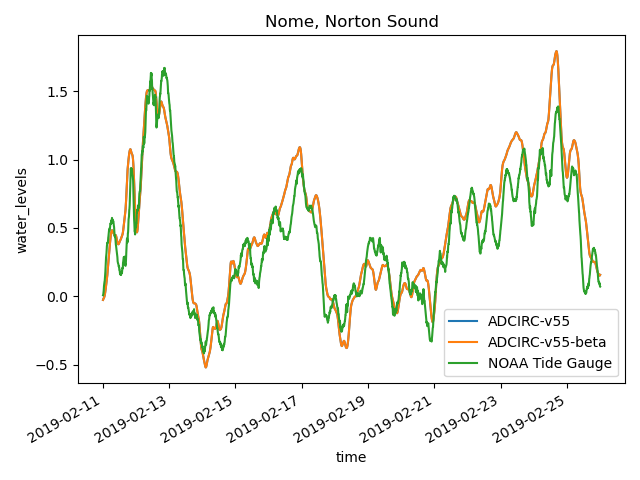

In [68]:
fig, ax = plt.subplots(1, 1)
f61.isel(station=station_idx)["zeta"].plot(ax=ax, label="ADCIRC-v55")
f61_beta.isel(station=station_idx)["zeta"].plot(ax=ax, label="ADCIRC-v55-beta")
noaa_data.plot(ax=ax, label="NOAA Tide Gauge")
ax.legend()
ax.set_title(f"{noaa_station['name']}")
fig.tight_layout()

## F62 - Station Water Column Depth Averaged Velocity

In [69]:
f62_path = get_file(v55, "fort.62.nc", "fort.62.nc")
f62_path

PosixPath('/Users/carlos/repos/pyadcirc/notebooks/data/AK_Feb2019/fort.62.nc')

In [70]:
f62 = xr.open_dataset(f62_path)
f62

<xarray.Dataset>
Dimensions:       (time: 3600, station: 27)
Coordinates:
  * time          (time) datetime64[ns] 2019-02-11T00:06:00 ... 2019-02-26
Dimensions without coordinates: station
Data variables:
    station_name  (station) |S50 ...
    x             (station) float64 ...
    y             (station) float64 ...
    u-vel         (time, station) float64 ...
    v-vel         (time, station) float64 ...
Attributes: (12/50)
    _FillValue:         -99999.0
    dry_Value:          -99999.0
    model:              ADCIRC
    version:            v55.01-10-g08f4100
    grid_type:          Triangular
    description:        OceanMesh2D
    ...                 ...
    sfea0:              58.643293
    cf:                 0.0015
    eslm:               -0.2
    cori:               0.0
    ntif:               8
    nbfr:               8

### All Stations

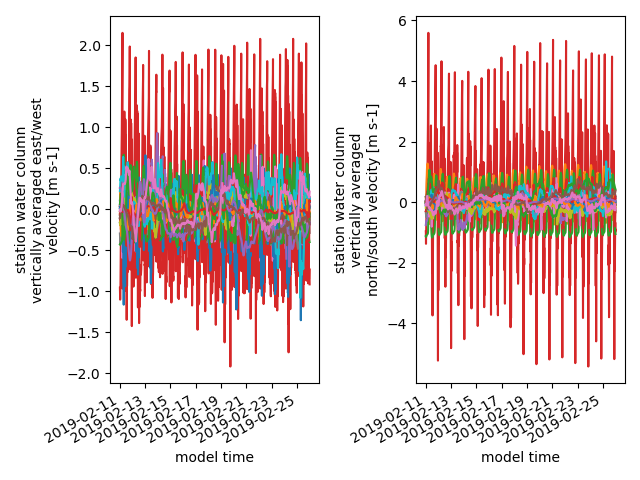

In [78]:
fig, ax = plt.subplots(1, 2)
for s in range(len(f62["station_name"])):
    f62.isel(station=s)["u-vel"].plot(ax=ax[0])
    f62.isel(station=s)["v-vel"].plot(ax=ax[1])
fig.tight_layout()

### Calculating Speed

In [73]:
f62["depth_avg_speed"] = np.sqrt(f62["u-vel"] ** 2 + f62["v-vel"] ** 2)

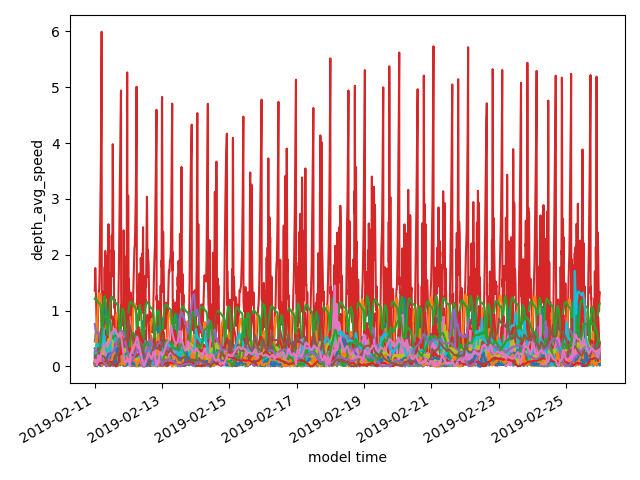

In [74]:
# This plot should show variability across every station
# Also no unreasonably high values (>4m across all stations)
fig, ax = plt.subplots(1, 1)
for s in range(len(f61["station_name"])):
    f62.isel(station=s)["depth_avg_speed"].plot(ax=ax)
fig.tight_layout()

### Station

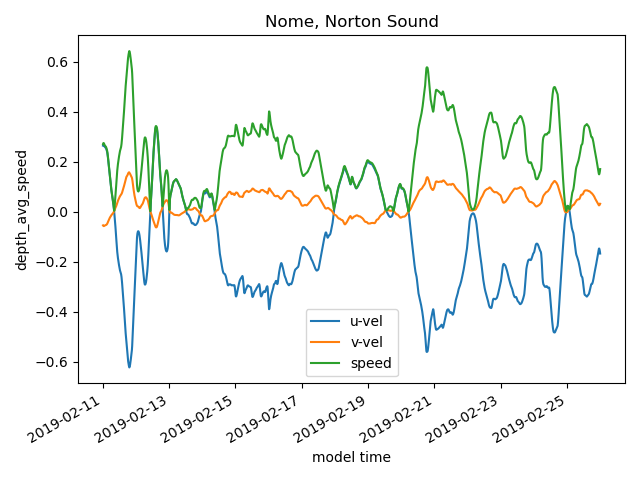

In [76]:
fig, ax = plt.subplots(1, 1)
f62.isel(station=station_idx)["u-vel"].plot(ax=ax, label="u-vel")
f62.isel(station=station_idx)["v-vel"].plot(ax=ax, label="v-vel")
f62.isel(station=station_idx)["depth_avg_speed"].plot(ax=ax, label="speed")
ax.legend()
ax.set_title(f"{noaa_station['name']}")
fig.tight_layout()

## F72,F73 - Station Atmospheric Forcing - Pressure and Wind

In [79]:
f71_path = get_file(v55, "fort.71.nc", "fort.71.nc")
f72_path = get_file(v55, "fort.72.nc", "fort.72.nc")
f71_path, f72_path

(PosixPath('/Users/carlos/repos/pyadcirc/notebooks/data/AK_Feb2019/fort.71.nc'),
 PosixPath('/Users/carlos/repos/pyadcirc/notebooks/data/AK_Feb2019/fort.72.nc'))

In [80]:
f71 = xr.open_dataset(f71_path)
f72 = xr.open_dataset(f72_path)

In [81]:
f71

<xarray.Dataset>
Dimensions:       (time: 3600, station: 27)
Coordinates:
  * time          (time) datetime64[ns] 2019-02-11T00:06:00 ... 2019-02-26
Dimensions without coordinates: station
Data variables:
    station_name  (station) |S50 ...
    x             (station) float64 ...
    y             (station) float64 ...
    pressure      (time, station) float64 ...
Attributes: (12/50)
    _FillValue:         -99999.0
    dry_Value:          -99999.0
    model:              ADCIRC
    version:            v55.01-10-g08f4100
    grid_type:          Triangular
    description:        OceanMesh2D
    ...                 ...
    sfea0:              58.643293
    cf:                 0.0015
    eslm:               -0.2
    cori:               0.0
    ntif:               8
    nbfr:               8

In [82]:
f72

<xarray.Dataset>
Dimensions:       (time: 3600, station: 27)
Coordinates:
  * time          (time) datetime64[ns] 2019-02-11T00:06:00 ... 2019-02-26
Dimensions without coordinates: station
Data variables:
    station_name  (station) |S50 ...
    x             (station) float64 ...
    y             (station) float64 ...
    windx         (time, station) float64 ...
    windy         (time, station) float64 ...
Attributes: (12/50)
    _FillValue:         -99999.0
    dry_Value:          -99999.0
    model:              ADCIRC
    version:            v55.01-10-g08f4100
    grid_type:          Triangular
    description:        OceanMesh2D
    ...                 ...
    sfea0:              58.643293
    cf:                 0.0015
    eslm:               -0.2
    cori:               0.0
    ntif:               8
    nbfr:               8

### All Stations

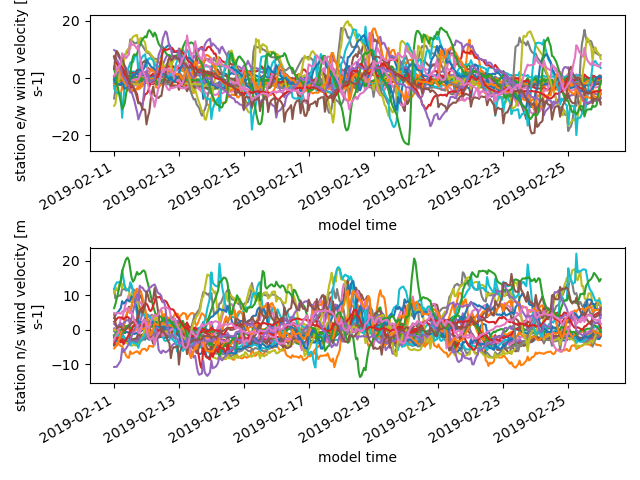

In [91]:
fig, ax = plt.subplots(2, 1)
for s in range(len(f72["station_name"])):
    f72.isel(station=s)["windx"].plot(ax=ax[0])
    f72.isel(station=s)["windy"].plot(ax=ax[1])
fig.tight_layout()

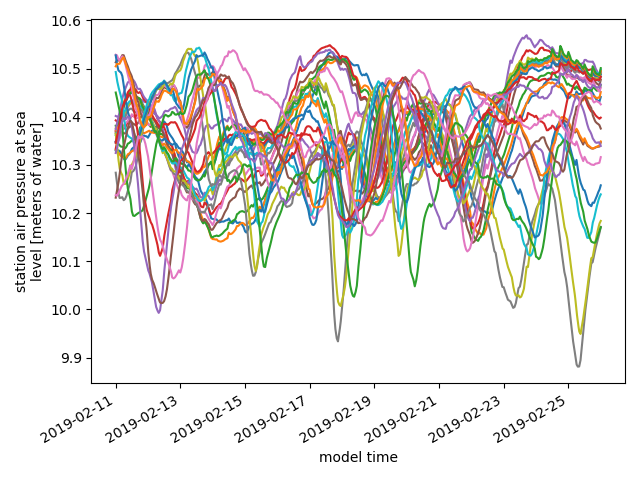

In [93]:
fig, ax = plt.subplots(1, 1)
for s in range(len(f72["station_name"])):
    f71.isel(station=s)["pressure"].plot(ax=ax)
fig.tight_layout()

### Wind Speed

In [86]:
f72["wind_speed"] = np.sqrt(f72["windx"] ** 2 + f72["windy"] ** 2)

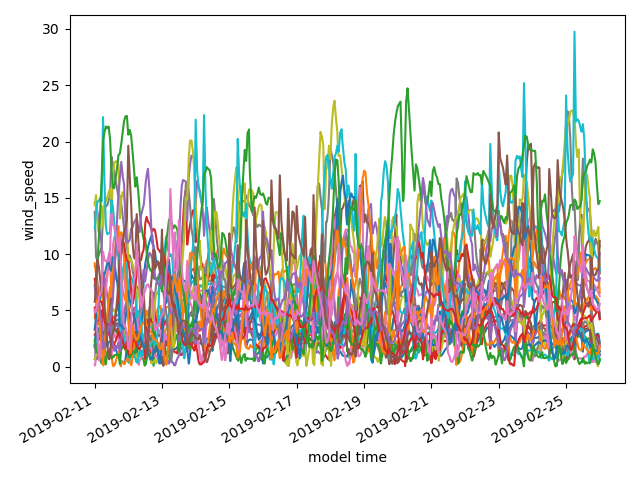

In [87]:
fig, ax = plt.subplots(1, 1)
for s in range(len(f72["station_name"])):
    f72.isel(station=s)["wind_speed"].plot(ax=ax)
fig.tight_layout()

### Station

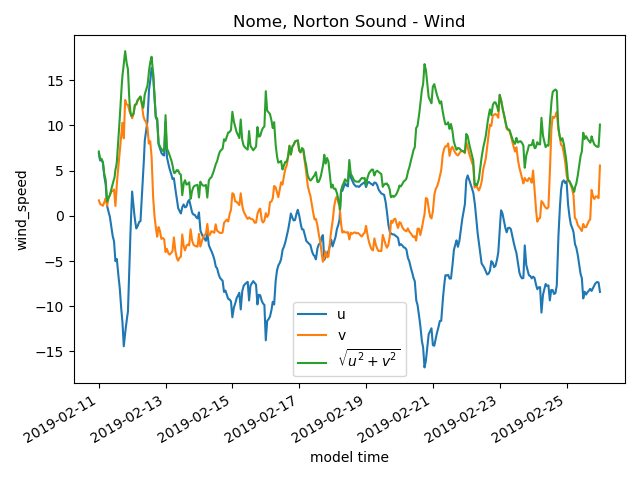

In [90]:
fig, ax = plt.subplots(1, 1)
f72.isel(station=station_idx)["windx"].plot(ax=ax, label="u")
f72.isel(station=station_idx)["windy"].plot(ax=ax, label="v")
f72.isel(station=station_idx)["wind_speed"].plot(ax=ax, label="$\sqrt{u^2+v^2}$")
ax.legend()
ax.set_title(f"{noaa_station['name']} - Wind")
fig.tight_layout()

# Beta Parameter Scan

## Running Base Case

Make sure setting default value of 0.6 doesn't change anything. 

In [108]:
in_dir = scans_base_input_path
execs_dir = ls6_v55_beta
write_proc = 4

scan_base_job_config = {
    "name": "beta-base-ak_lw_feb2019_wind+ice",
    "app": "ls6_adcirc--0.0.0",
    "desc": (
        "ADCIRC LW Mesh on LS6 with Feb2019 wind and ice data using v55",
        "branch implementing nodal beta parameter for ice parametrization. ",
        "Using nodal attribute value but setting to default so should return ",
        "same time series."
    ),
    "queue": "normal",
    "node_count": 5,
    "processors_per_node": 30,
    "memory_per_node": 0,
    "max_run_time": "00:30:00",
}
scan_base_job_config["inputs"] = {}
scan_base_job_config["parameters"] = {
    "inputDirectory": f"{in_dir}",
    "execDirectory": f"{execs_dir}",
    "writeProcesses": write_proc,
}
pp(scan_base_job_config)

{'app': 'ls6_adcirc--0.0.0',
 'desc': ('ADCIRC LW Mesh on LS6 with Feb2019 wind and ice data using v55',
          'branch implementing nodal beta parameter for ice parametrization. ',
          'Using nodal attribute value but setting to default so should '
          'return ',
          'same time series.'),
 'inputs': {},
 'max_run_time': '00:30:00',
 'memory_per_node': 0,
 'name': 'beta-base-ak_lw_feb2019_wind+ice',
 'node_count': 5,
 'parameters': {'execDirectory': '/work2/06307/clos21/pub/adcirc/execs/ls6/v55_nodal_beta',
                'inputDirectory': '/work2/06307/clos21/pub/adcirc/inputs/Alaska/scans/Feb2019/CSFv2/base',
                'writeProcesses': 4},
 'processors_per_node': 30,
 'queue': 'normal'}


In [109]:
scan_base_job_config = tjm.deploy_job(jm, job_config=scan_base_job_config)
pp(scan_base_job_config)

{'app': 'ls6_adcirc--0.0.0',
 'desc': ['ADCIRC LW Mesh on LS6 with Feb2019 wind and ice data using v55',
          'branch implementing nodal beta parameter for ice parametrization. ',
          'Using nodal attribute value but setting to default so should '
          'return ',
          'same time series.'],
 'entry_script': 'run.sh',
 'inputs': {},
 'job_dir': '/scratch/06307/clos21/l1/jobs/beta-base-ak_lw_feb2019_wind+ice_20220209_105226',
 'job_id': 'beta-base-ak_lw_feb2019_wind+ice_20220209_105226',
 'max_run_time': '00:30:00',
 'memory_per_node': 0,
 'name': 'beta-base-ak_lw_feb2019_wind+ice',
 'node_count': 5,
 'parameters': {'execDirectory': '/work2/06307/clos21/pub/adcirc/execs/ls6/v55_nodal_beta',
                'inputDirectory': '/work2/06307/clos21/pub/adcirc/inputs/Alaska/scans/Feb2019/CSFv2/base',
                'writeProcesses': 4},
 'processors_per_node': 30,
 'queue': 'normal'}


In [110]:
scan_base_job_config = tjm.submit_job(jm, job_id=scan_base_job_config['job_id'])
pp(scan_base_job_config)

{'app': 'ls6_adcirc--0.0.0',
 'desc': ['ADCIRC LW Mesh on LS6 with Feb2019 wind and ice data using v55',
          'branch implementing nodal beta parameter for ice parametrization. ',
          'Using nodal attribute value but setting to default so should '
          'return ',
          'same time series.'],
 'entry_script': 'run.sh',
 'inputs': {},
 'job_dir': '/scratch/06307/clos21/l1/jobs/beta-base-ak_lw_feb2019_wind+ice_20220209_105226',
 'job_id': 'beta-base-ak_lw_feb2019_wind+ice_20220209_105226',
 'max_run_time': '00:30:00',
 'memory_per_node': 0,
 'name': 'beta-base-ak_lw_feb2019_wind+ice',
 'node_count': 5,
 'parameters': {'execDirectory': '/work2/06307/clos21/pub/adcirc/execs/ls6/v55_nodal_beta',
                'inputDirectory': '/work2/06307/clos21/pub/adcirc/inputs/Alaska/scans/Feb2019/CSFv2/base',
                'writeProcesses': 4},
 'processors_per_node': 30,
 'queue': 'normal',
 'slurm_id': '57929'}


In [111]:
tjm.get_queue(jm)

[{'job_id': '57929',
  'job_name': 'beta-base-',
  'username': 'clos21',
  'state': 'Running',
  'nodes': '5',
  'remaining': '5',
  'start_time': '0:29:57'}]

And we can peak at the end of the file to see how long the run is going

In [155]:
print(tjm.peak_file(jm, str(Path(scan_base_job_config["job_dir"]) / "output.eo.txt"), tail=20))

ERROR: writeOutArrayNetCDF: No netCDF for files with unit number 91.
ERROR: writeOutArrayNetCDF: No netCDF for files with unit number 91.
ERROR: writeOutArrayNetCDF: No netCDF for files with unit number 91.
ERROR: writeOutArrayNetCDF: No netCDF for files with unit number 91.
ERROR: writeOutArrayNetCDF: No netCDF for files with unit number 91.
INFO: owi_readNextSnap: Processing Oceanweather wind data for time stamp    190226000  0
ERROR: writeOutArrayNetCDF: No netCDF for files with unit number 91.
ERROR: writeOutArrayNetCDF: No netCDF for files with unit number 91.
ERROR: writeOutArrayNetCDF: No netCDF for files with unit number 91.
ERROR: writeOutArrayNetCDF: No netCDF for files with unit number 91.
ERROR: writeOutArrayNetCDF: No netCDF for files with unit number 91.
ERROR: writeOutArrayNetCDF: No netCDF for files with unit number 91.
ERROR: writeOutArrayNetCDF: No netCDF for files with unit number 91.
ERROR: writeOutArrayNetCDF: No netCDF for files with unit number 91.
ERROR: writeOu

In [194]:
print(
    tjm.peak_file(
        jm,
        str(
            Path(submitted["job_dir"])
            / f"{submitted['job_id']}.e{submitted['slurm_id']}"
        ),
        tail=2,
    )
)

+ ibrun -np 4 ./padcirc -W 0
slurmstepd: error: *** JOB 50473 ON c302-005 CANCELLED AT 2022-02-03T18:03:25 DUE TO TIME LIMIT ***



## Creating Nodal Attribute Files

In [145]:
nodal_dir = ak_data_dir / "beta"
nodal_dir.mkdir(exist_ok=True)

f13_path = nodal_dir / "base.fort.13"

In [140]:
f13['v0'].sel(AttrName='beta')

<xarray.DataArray 'v0' ()>
array(1.9)
Coordinates:
    AttrName  <U4 'beta'

In [141]:
f13_path

PosixPath('/Users/carlos/repos/pyadcirc/notebooks/data/AK_Feb2019/beta/base.fort.13')

In [146]:
tjm.download(jm, scans_base_input_path / "fort.13", f13_path)

In [147]:
f13 = au.read_fort13(str(f13_path))
f13

<xarray.Dataset>
Dimensions:                                       (AttrName: 4, JN: 290660)
Coordinates:
  * AttrName                                      (AttrName) object 'beta' .....
  * JN                                            (JN) int64 1 2 ... 401143
Data variables:
    Units                                         (AttrName) object '1' ... '1'
    ValuesPerNode                                 (AttrName) int64 1 1 1 1
    v0                                            (AttrName) float64 0.6 ... ...
    beta_0                                        (JN) object nan nan ... nan
    primitive_weighting_in_continuity_equation_0  (JN) float64 0.02 0.02 ... nan
    internal_tide_friction_0                      (JN) float64 nan nan ... nan
    advection_state_0                             (JN) float64 nan nan ... 1e+05
Attributes:
    AGRID:       OceanMesh2D
    NumOfNodes:  443770
    NAttr:       4

In [148]:
f13['v0'].sel(AttrName='beta')


<xarray.DataArray 'v0' ()>
array(0.6)
Coordinates:
    AttrName  <U4 'beta'

In [149]:
beta_vals = np.arange(0.0,2.0,0.1)
beta_vals

array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. , 1.1, 1.2,
       1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9])

In [150]:
for b in beta_vals:
    f13['v0'][0] = b
    au.write_fort13(f13, str(nodal_dir / f'beta_{b:.1f}_fort.13') )

In [151]:
os.system(f'ls {nodal_dir}')

base.fort.13
beta_0.0_fort.13
beta_0.1_fort.13
beta_0.2_fort.13
beta_0.3_fort.13
beta_0.4_fort.13
beta_0.5_fort.13
beta_0.6_fort.13
beta_0.7_fort.13
beta_0.8_fort.13
beta_0.9_fort.13
beta_1.0_fort.13
beta_1.1_fort.13
beta_1.2_fort.13
beta_1.3_fort.13
beta_1.4_fort.13
beta_1.5_fort.13
beta_1.6_fort.13
beta_1.7_fort.13
beta_1.8_fort.13
beta_1.9_fort.13


0

In [154]:
tjm.upload(jm, str(nodal_dir), str(scan_base_input_path.parents[0]))

## Configuring pylauncher run